# 📊 Fraud Detection Pipeline - Part 6: Model Evaluation

## 📋 Overview
This notebook covers comprehensive model evaluation:
- Load all trained ML and DL models
- Evaluate on holdout test set
- Compare all models side by side
- Threshold optimization
- Business metrics analysis
- Feature importance (SHAP)
- Final recommendations

---

## 1️⃣ Setup & Load Everything

In [ ]:
!pip install -q shap

In [2]:
import os
BASE_PATH = os.path.abspath('.')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.metrics import (
    classification_report, confusion_matrix, roc_auc_score,
    precision_recall_curve, roc_curve, average_precision_score,
    f1_score, precision_score, recall_score, accuracy_score
)

import tensorflow as tf
from tensorflow import keras

import shap
import pickle
import json
import warnings
warnings.filterwarnings('ignore')

COLORS = {
    'primary': '#3498db',
    'secondary': '#2ecc71',
    'danger': '#e74c3c',
    'warning': '#f39c12',
    'info': '#9b59b6',
    'dark': '#2c3e50'
}

print('✅ Libraries imported!')

In [4]:
X_holdout = np.load(f'{BASE_PATH}/data/splits/X_holdout.npy')
y_holdout = np.load(f'{BASE_PATH}/data/splits/y_holdout.npy')

X_val = np.load(f'{BASE_PATH}/data/splits/X_val.npy')
y_val = np.load(f'{BASE_PATH}/data/splits/y_val.npy')

with open(f'{BASE_PATH}/reports/metrics/feature_engineering_info.json', 'r') as f:
    feat_info = json.load(f)
FEATURE_NAMES = feat_info['final_features']

print(f'📊 Holdout test set: {X_holdout.shape}')
print(f'📊 Validation set: {X_val.shape}')
print(f'🎯 Holdout fraud rate: {y_holdout.mean()*100:.2f}%')

📊 Holdout test set: (59054, 91)
📊 Validation set: (59054, 91)
🎯 Holdout fraud rate: 3.50%


In [5]:
print('📦 Loading ML models...')

ml_models = {}
ml_model_files = ['logistic_regression', 'random_forest', 'xgboost', 'lightgbm', 'catboost', 'xgboost_tuned']

for model_name in ml_model_files:
    try:
        with open(f'{BASE_PATH}/models/ml/{model_name}.pkl', 'rb') as f:
            ml_models[model_name] = pickle.load(f)
        print(f'  ✓ Loaded {model_name}')
    except FileNotFoundError:
        print(f'  ✗ {model_name} not found')

print(f'\n📊 Loaded {len(ml_models)} ML models')

📦 Loading ML models...
  ✓ Loaded logistic_regression
  ✓ Loaded random_forest
  ✓ Loaded xgboost
  ✓ Loaded lightgbm
  ✓ Loaded catboost
  ✓ Loaded xgboost_tuned

📊 Loaded 6 ML models


In [7]:
print('📦 Loading DL models...')

dl_models = {}

def focal_loss(gamma=2.0, alpha=0.25):
    def focal_loss_fn(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        cross_entropy = -y_true * tf.math.log(y_pred) - (1 - y_true) * tf.math.log(1 - y_pred)
        p_t = y_true * y_pred + (1 - y_true) * (1 - y_pred)
        alpha_t = y_true * alpha + (1 - y_true) * (1 - alpha)
        focal_weight = alpha_t * tf.pow(1 - p_t, gamma)
        return tf.reduce_mean(focal_weight * cross_entropy)
    return focal_loss_fn

dl_model_files = {
    'mlp': 'mlp_final.keras',
    'deep_nn': 'deep_nn_final.keras',
    'autoencoder': 'autoencoder_final.keras'
}

focal_loss_custom = focal_loss()

for model_name, filename in dl_model_files.items():
    try:
        if model_name == 'deep_nn':
            dl_models[model_name] = keras.models.load_model(
                f'{BASE_PATH}/models/dl/{filename}',
                custom_objects={'focal_loss_fn': focal_loss_custom}
            )
        else:
            dl_models[model_name] = keras.models.load_model(
                f'{BASE_PATH}/models/dl/{filename}'
            )
        print(f'  ✓ Loaded {model_name}')
    except Exception as e:
        print(f'  ✗ {model_name}: {e}')

try:
    with open(f'{BASE_PATH}/models/dl/autoencoder_config.json', 'r') as f:
        ae_config = json.load(f)
    print(f'  ✓ Loaded autoencoder config')
except:
    ae_config = {'optimal_threshold': 0.5}

print(f'\n📊 Loaded {len(dl_models)} DL models')

📦 Loading DL models...
  ✓ Loaded mlp
  ✓ Loaded deep_nn
  ✓ Loaded autoencoder
  ✓ Loaded autoencoder config

📊 Loaded 3 DL models


## 2️⃣ Evaluate All Models on Holdout Set

In [8]:
def evaluate_model(y_true, y_pred, y_proba, model_name):
    """Calculate comprehensive metrics"""
    return {
        'Model': model_name,
        'Accuracy': accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred),
        'Recall': recall_score(y_true, y_pred),
        'F1': f1_score(y_true, y_pred),
        'ROC-AUC': roc_auc_score(y_true, y_proba),
        'PR-AUC': average_precision_score(y_true, y_proba)
    }

In [9]:
all_results = []
all_probas = {}

print('📊 Evaluating models on holdout set...')
print('='*60)

for name, model in ml_models.items():
    y_proba = model.predict_proba(X_holdout)[:, 1]
    y_pred = (y_proba >= 0.5).astype(int)
    
    metrics = evaluate_model(y_holdout, y_pred, y_proba, f'ML: {name}')
    all_results.append(metrics)
    all_probas[name] = y_proba
    
    print(f"✓ {name}: ROC-AUC={metrics['ROC-AUC']:.4f}, F1={metrics['F1']:.4f}")

for name, model in dl_models.items():
    if name == 'autoencoder':
        X_pred = model.predict(X_holdout, verbose=0)
        y_proba = np.mean(np.power(X_holdout - X_pred, 2), axis=1)
        y_proba_norm = (y_proba - y_proba.min()) / (y_proba.max() - y_proba.min())
        y_pred = (y_proba > ae_config['optimal_threshold']).astype(int)
        y_proba_for_metrics = y_proba
    else:
        y_proba = model.predict(X_holdout, verbose=0).flatten()
        y_pred = (y_proba >= 0.5).astype(int)
        y_proba_for_metrics = y_proba
    
    metrics = evaluate_model(y_holdout, y_pred, y_proba_for_metrics, f'DL: {name}')
    all_results.append(metrics)
    all_probas[name] = y_proba_for_metrics
    
    print(f"✓ {name}: ROC-AUC={metrics['ROC-AUC']:.4f}, F1={metrics['F1']:.4f}")

📊 Evaluating models on holdout set...
✓ logistic_regression: ROC-AUC=0.8306, F1=0.2074
✓ random_forest: ROC-AUC=0.8945, F1=0.3848
✓ xgboost: ROC-AUC=0.9464, F1=0.4970
✓ lightgbm: ROC-AUC=0.9358, F1=0.3943
✓ catboost: ROC-AUC=0.9255, F1=0.3544
✓ xgboost_tuned: ROC-AUC=0.9500, F1=0.6263
✓ mlp: ROC-AUC=0.8677, F1=0.2435
✓ deep_nn: ROC-AUC=0.8549, F1=0.2954
✓ autoencoder: ROC-AUC=0.7707, F1=0.2433


In [10]:
results_df = pd.DataFrame(all_results)
results_df = results_df.sort_values('ROC-AUC', ascending=False).reset_index(drop=True)

print('\n📊 All Models Ranking (by ROC-AUC):')
results_df


📊 All Models Ranking (by ROC-AUC):


,Model,Accuracy,Precision,Recall,F1,ROC-AUC,PR-AUC
0,ML: xgboost_tuned,0.969570,0.549034,0.728945,0.626326,0.949994,0.745567
1,ML: xgboost,0.945203,0.366071,0.773959,0.497047,0.946367,0.710395
2,ML: lightgbm,0.915264,0.262912,0.788480,0.394336,0.935756,0.642586
3,ML: catboost,0.899617,0.228640,0.787512,0.354389,0.925462,0.598483
4,ML: random_forest,0.927439,0.273525,0.648596,0.384781,0.894484,0.537433
5,DL: mlp,0.844701,0.146763,0.714424,0.243504,0.867685,0.447971
6,DL: deep_nn,0.970671,0.926020,0.175702,0.295362,0.854855,0.434155
7,ML: logistic_regression,0.816558,0.122145,0.685866,0.207361,0.830639,0.322596
8,DL: autoencoder,0.915416,0.177067,0.388674,0.243296,0.770716,0.145402


## 3️⃣ Comprehensive Visualizations

In [11]:
fig = make_subplots(
    rows=2, cols=3,
    subplot_titles=('ROC-AUC', 'PR-AUC', 'F1 Score', 'Precision', 'Recall', 'Accuracy')
)

metrics = ['ROC-AUC', 'PR-AUC', 'F1', 'Precision', 'Recall', 'Accuracy']
positions = [(1, 1), (1, 2), (1, 3), (2, 1), (2, 2), (2, 3)]

n_models = len(results_df)
colors = px.colors.qualitative.Set3[:n_models]

for metric, pos in zip(metrics, positions):
    sorted_df = results_df.sort_values(metric, ascending=True)
    
    fig.add_trace(
        go.Bar(
            y=sorted_df['Model'],
            x=sorted_df[metric],
            orientation='h',
            marker_color=colors,
            text=[f'{x:.4f}' for x in sorted_df[metric]],
            textposition='outside',
            showlegend=False
        ),
        row=pos[0], col=pos[1]
    )

fig.update_layout(
    title='📊 Complete Model Comparison - All Metrics',
    title_font_size=20,
    height=800,
    width=1200
)

fig.show()
fig.write_html(f'{BASE_PATH}/reports/figures/29_all_models_comparison.html')

In [12]:
fig = go.Figure()

colors = px.colors.qualitative.Set2 + px.colors.qualitative.Set1

for idx, (name, proba) in enumerate(all_probas.items()):
    fpr, tpr, _ = roc_curve(y_holdout, proba)
    auc = roc_auc_score(y_holdout, proba)
    
    fig.add_trace(
        go.Scatter(
            x=fpr, y=tpr,
            mode='lines',
            name=f'{name} (AUC={auc:.4f})',
            line=dict(width=2, color=colors[idx % len(colors)])
        )
    )

fig.add_trace(
    go.Scatter(
        x=[0, 1], y=[0, 1],
        mode='lines',
        line=dict(dash='dash', color='gray'),
        name='Random',
        showlegend=False
    )
)

fig.update_layout(
    title='📈 ROC Curves - All Models Comparison (Holdout Set)',
    title_font_size=18,
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    height=600,
    legend=dict(x=0.6, y=0.05)
)

fig.show()
fig.write_html(f'{BASE_PATH}/reports/figures/30_all_roc_curves.html')

In [13]:
fig = go.Figure()

for idx, (name, proba) in enumerate(all_probas.items()):
    precision, recall, _ = precision_recall_curve(y_holdout, proba)
    pr_auc = average_precision_score(y_holdout, proba)
    
    fig.add_trace(
        go.Scatter(
            x=recall, y=precision,
            mode='lines',
            name=f'{name} (AP={pr_auc:.4f})',
            line=dict(width=2, color=colors[idx % len(colors)])
        )
    )

fraud_rate = y_holdout.mean()
fig.add_hline(y=fraud_rate, line_dash='dash', line_color='gray',
              annotation_text=f'Baseline ({fraud_rate:.2%})')

fig.update_layout(
    title='📈 Precision-Recall Curves - All Models',
    title_font_size=18,
    xaxis_title='Recall',
    yaxis_title='Precision',
    height=600,
    legend=dict(x=0.02, y=0.02)
)

fig.show()
fig.write_html(f'{BASE_PATH}/reports/figures/31_all_pr_curves.html')

## 4️⃣ Threshold Optimization

In [14]:
best_model_name = results_df.iloc[0]['Model'].replace('ML: ', '').replace('DL: ', '')
best_proba = all_probas[best_model_name]

print(f'🏆 Best Model: {best_model_name}')
print('\n🔍 Finding optimal thresholds...')

🏆 Best Model: xgboost_tuned

🔍 Finding optimal thresholds...


In [15]:
thresholds = np.arange(0.1, 0.9, 0.05)
threshold_results = []

for thresh in thresholds:
    y_pred = (best_proba >= thresh).astype(int)
    
    threshold_results.append({
        'Threshold': thresh,
        'Precision': precision_score(y_holdout, y_pred),
        'Recall': recall_score(y_holdout, y_pred),
        'F1': f1_score(y_holdout, y_pred),
        'Accuracy': accuracy_score(y_holdout, y_pred)
    })

thresh_df = pd.DataFrame(threshold_results)

In [16]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=thresh_df['Threshold'], y=thresh_df['Precision'],
                         mode='lines+markers', name='Precision', line=dict(color=COLORS['primary'])))
fig.add_trace(go.Scatter(x=thresh_df['Threshold'], y=thresh_df['Recall'],
                         mode='lines+markers', name='Recall', line=dict(color=COLORS['danger'])))
fig.add_trace(go.Scatter(x=thresh_df['Threshold'], y=thresh_df['F1'],
                         mode='lines+markers', name='F1 Score', line=dict(color=COLORS['secondary'])))

best_f1_idx = thresh_df['F1'].idxmax()
best_threshold = thresh_df.loc[best_f1_idx, 'Threshold']
best_f1 = thresh_df.loc[best_f1_idx, 'F1']

fig.add_vline(x=best_threshold, line_dash='dash', line_color='green',
              annotation_text=f'Optimal: {best_threshold:.2f}')

fig.update_layout(
    title=f'📊 Threshold Optimization for {best_model_name}',
    title_font_size=18,
    xaxis_title='Decision Threshold',
    yaxis_title='Score',
    height=500
)

fig.show()
fig.write_html(f'{BASE_PATH}/reports/figures/32_threshold_optimization.html')

print(f'\n📊 Optimal threshold (max F1): {best_threshold:.2f}')
print(f'📊 F1 at optimal: {best_f1:.4f}')


📊 Optimal threshold (max F1): 0.70
📊 F1 at optimal: 0.7146


## Feature Importance (SHAP)

In [21]:
print('🔍 Computing SHAP values for best model...')

if 'xgboost' in ml_models or 'xgboost_tuned' in ml_models:
    shap_model_name = 'xgboost_tuned' if 'xgboost_tuned' in ml_models else 'xgboost'
    shap_model = ml_models[shap_model_name]
elif 'lightgbm' in ml_models:
    shap_model_name = 'lightgbm'
    shap_model = ml_models['lightgbm']
else:
    shap_model_name = list(ml_models.keys())[0]
    shap_model = ml_models[shap_model_name]

print(f'📊 Using {shap_model_name} for SHAP analysis')

🔍 Computing SHAP values for best model...
📊 Using xgboost_tuned for SHAP analysis


In [22]:
sample_size = min(1000, len(X_holdout))
sample_idx = np.random.choice(len(X_holdout), sample_size, replace=False)
X_sample = X_holdout[sample_idx]

explainer = shap.TreeExplainer(shap_model)
shap_values = explainer.shap_values(X_sample)

print(f'✅ SHAP values computed for {sample_size} samples')

✅ SHAP values computed for 1000 samples


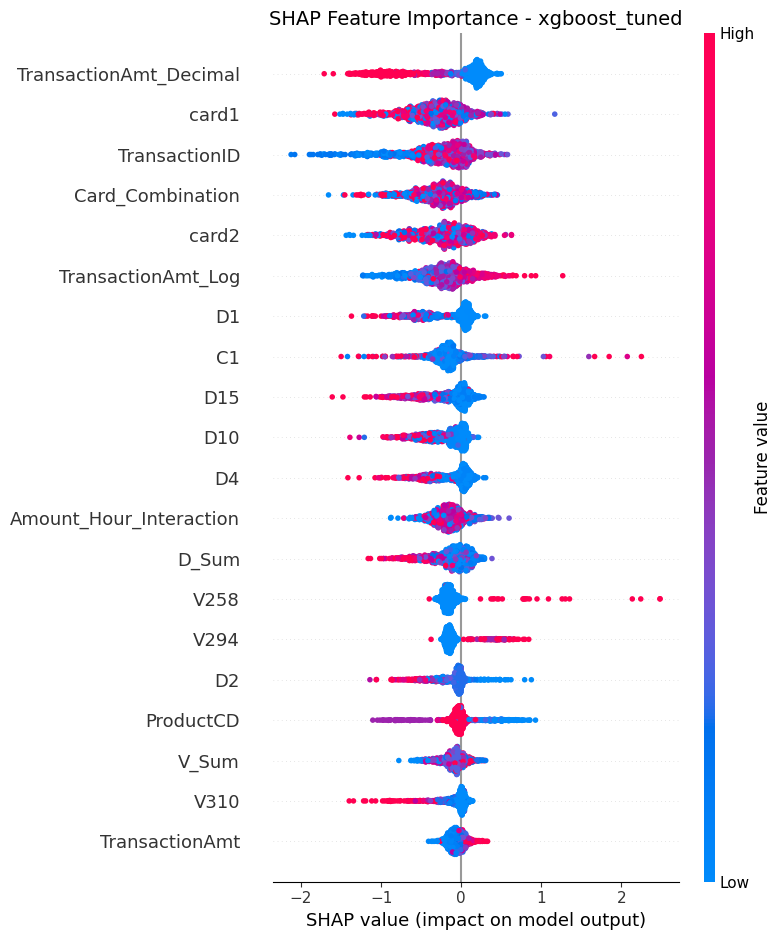

💾 SHAP summary plot saved!


In [23]:
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values, X_sample, feature_names=FEATURE_NAMES, show=False)
plt.title(f'SHAP Feature Importance - {shap_model_name}', fontsize=14)
plt.tight_layout()
plt.savefig(f'{BASE_PATH}/reports/figures/34_shap_summary.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'💾 SHAP summary plot saved!')

In [24]:
shap_importance = pd.DataFrame({
    'Feature': FEATURE_NAMES,
    'Importance': np.abs(shap_values).mean(axis=0)
}).sort_values('Importance', ascending=False)

top_20 = shap_importance.head(20)

fig = go.Figure(go.Bar(
    x=top_20['Importance'],
    y=top_20['Feature'],
    orientation='h',
    marker=dict(
        color=top_20['Importance'],
        colorscale='Viridis'
    )
))

fig.update_layout(
    title=f'📊 Top 20 Features by SHAP Importance ({shap_model_name})',
    title_font_size=18,
    xaxis_title='Mean |SHAP Value|',
    height=600,
    margin=dict(l=200)
)

fig.show()
fig.write_html(f'{BASE_PATH}/reports/figures/35_shap_importance.html')

## 7️⃣ Confusion Matrix - Best Model

In [25]:
best_model_key = best_model_name
y_pred_best = (all_probas[best_model_key] >= best_threshold).astype(int)

cm = confusion_matrix(y_holdout, y_pred_best)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Absolute Numbers', 'Normalized (%)')
)

fig.add_trace(
    go.Heatmap(
        z=cm,
        x=['Pred: Legit', 'Pred: Fraud'],
        y=['True: Legit', 'True: Fraud'],
        colorscale='Blues',
        text=[[f'{v:,}' for v in row] for row in cm],
        texttemplate='%{text}',
        textfont={'size': 16},
        showscale=False
    ),
    row=1, col=1
)

fig.add_trace(
    go.Heatmap(
        z=cm_normalized * 100,
        x=['Pred: Legit', 'Pred: Fraud'],
        y=['True: Legit', 'True: Fraud'],
        colorscale='Blues',
        text=[[f'{v:.1f}%' for v in row] for row in cm_normalized * 100],
        texttemplate='%{text}',
        textfont={'size': 16},
        showscale=False
    ),
    row=1, col=2
)

fig.update_layout(
    title=f'📊 Confusion Matrix - {best_model_name} (Threshold: {best_threshold:.2f})',
    title_font_size=18,
    height=400
)

fig.show()
fig.write_html(f'{BASE_PATH}/reports/figures/36_best_model_cm.html')

In [26]:
print(f'\n📋 Classification Report - {best_model_name}')
print('='*60)
print(classification_report(y_holdout, y_pred_best, target_names=['Legitimate', 'Fraud']))


📋 Classification Report - xgboost_tuned
              precision    recall  f1-score   support

  Legitimate       0.99      0.99      0.99     56988
       Fraud       0.79      0.65      0.71      2066

    accuracy                           0.98     59054
   macro avg       0.89      0.82      0.85     59054
weighted avg       0.98      0.98      0.98     59054



## 8️⃣ Final Summary & Recommendations

In [27]:
print('='*70)
print('📊 FINAL MODEL EVALUATION SUMMARY')
print('='*70)

print(f'\n🏆 BEST MODEL: {results_df.iloc[0]["Model"]}')
print('-'*50)
for metric in ['ROC-AUC', 'PR-AUC', 'F1', 'Precision', 'Recall', 'Accuracy']:
    print(f'  {metric}: {results_df.iloc[0][metric]:.4f}')

print(f'\n📊 OPTIMAL THRESHOLD: {best_threshold:.2f}')

print(f'\n💰 BUSINESS IMPACT (Best Model):')
best_biz = business_df[business_df['Model'] == best_model_name].iloc[0]
print(f'  True Positives (Fraud Caught): {int(best_biz["TP"]):,}')
print(f'  False Negatives (Fraud Missed): {int(best_biz["FN"]):,}')
print(f'  False Positives (False Alarms): {int(best_biz["FP"]):,}')
print(f'  Total Cost: ${best_biz["Total_Cost"]:,.2f}')

print(f'\n🔑 TOP 5 MOST IMPORTANT FEATURES:')
for i, row in shap_importance.head(5).iterrows():
    print(f'  {i+1}. {row["Feature"]}: {row["Importance"]:.4f}')

📊 FINAL MODEL EVALUATION SUMMARY

🏆 BEST MODEL: ML: xgboost_tuned
--------------------------------------------------
  ROC-AUC: 0.9500
  PR-AUC: 0.7456
  F1: 0.6263
  Precision: 0.5490
  Recall: 0.7289
  Accuracy: 0.9696

📊 OPTIMAL THRESHOLD: 0.70

💰 BUSINESS IMPACT (Best Model):
  True Positives (Fraud Caught): 1,506
  False Negatives (Fraud Missed): 560
  False Positives (False Alarms): 1,237
  Total Cost: $68,370.00

🔑 TOP 5 MOST IMPORTANT FEATURES:
  51. TransactionAmt_Decimal: 0.4234
  85. card1: 0.3697
  58. TransactionID: 0.3665
  8. Card_Combination: 0.3267
  69. card2: 0.3132


In [29]:
final_results = {
    'best_model': results_df.iloc[0]['Model'],
    'holdout_metrics': results_df.iloc[0].to_dict(),
    'optimal_threshold': float(best_threshold),
    'top_features': shap_importance.head(10).to_dict('records'),
    'all_models_ranking': results_df.to_dict('records')
}

with open(f'{BASE_PATH}/reports/metrics/final_evaluation.json', 'w') as f:
    json.dump(final_results, f, indent=2, default=str)

results_df.to_csv(f'{BASE_PATH}/reports/metrics/all_models_holdout_results.csv', index=False)
shap_importance.to_csv(f'{BASE_PATH}/reports/metrics/shap_importance.csv', index=False)

print('\n💾 All evaluation results saved!')


💾 All evaluation results saved!
